faktorid:
- piirkond 
- mitu treeingandmepuntki on
	- piirkonnas
	- kokku
- bpointide arv piirkonnas (+-lisa nt50%)

mõõdikud
- piirkonna treening- vs testviga
  - * treening vs test abs ja suht
  - samadel X, erineva müraga
  - X_grid
- 2-3 e. abs vahe
- (2-3)/3 e. suhteline vahe

- 2-3test e. abs vahe
- (2-3test)/3test e. suhteline vahe 
	
TODO lisada 5xrmse plotile 3test ja 3train

eesmärk: faktoritest lähtuvalt leida testviga, mis intuitiivselt töötaks


- vähem andmeid =? suurem ülesobitus (testviga>>treening).
  - ülesobitus sümptom 2: 2 hakkab väiksemaks  kui 3. 
  - kui palju 2<3 versus treening&test **MSE** erinevus. **uurimisküsimus**
  - kas 2miinus3 on seotud treening-test viga -> 3 ongi testviga ehk kas 2 on treeningviga. 
	- **vahe muutumine andmete suurusega seoses. kuidas 2 on treeningveaga sõltuvuses. .võib ka vaadata 2-3 märki, kui on väikesem siis on liiga enesekindel & vice versa**
	- **vahet saaks vaadata eri kohtades. kõik eelnev nii globaalne kui ka lookaalne**
		- **kas serva efekt eksisteerib**
  - ei ole vaja ette geneda kõike
        

In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2
%cd ..


c:\Users\troosma\Documents\Ylikool\6. semester\Bakatöö\bakatoo


In [2]:
import sys
import os

import numpy as np
import pandas as pd
import random
import tensorflow as tf

from tensorflow import keras
from keras import layers

from matplotlib import pyplot as plt
import seaborn as sns

from scripts.CustomCallbacks import CustomLogger
import scripts.utils as utils
import scripts.Slopes as Slopes

from tqdm import tqdm
import json
utils.reset_seeds(0)


In [196]:
df_columns = ['train_size', 'random_seed', 'multiplier', 'region',
              *[f'bpoints_in_{chr(a)}' for a in range(97, 97+5)],
              *[f'ext_bpoints_in_{chr(a)}' for a in range(97, 97+5)],
              *[f'abs_diff_in_{chr(a)}' for a in range(97, 97+5)],
              *[f'rel_diff_in_{chr(a)}' for a in range(97, 97+5)],
              *[f'raw_mean2_in_{chr(a)}' for a in range(97, 97+5)],
              *[f'raw_mean3_in_{chr(a)}' for a in range(97, 97+5)], ]


In [147]:
def process_break_points(file_path, regions):
    with open(file_path, 'rb') as f:
        data = np.load(f)
    # print(data)
    return np.histogram(data[:, 0], bins=regions)[0]


def process_break_points_laiem(file_path, regions):
    with open(file_path, 'rb') as f:
        data = np.load(f)
    # print(data[:,0])
    result = np.zeros(len(regions))
    for idx, reg in enumerate(regions):
        
        result[idx] = len(np.where((data[:, 0] >= reg[0])
                          & (data[:, 0] < reg[1]))[0])

        #print(len(np.where((data[:, 0] > reg[0]) & (data[:, 0] < reg[1]))[0]))
    return result


In [493]:
def process_rmse(file_path, regions):
    with open(file_path, 'rb') as f:
        data = np.load(f)

    # splitime andmed vastavalt regionitele jätame välja piirkonnad mis on väiksem ja suurem kui andmete piirid
    r_all = np.split(data, np.searchsorted(data[:, 0], v=regions))[1:-1]
    
    # absoluutsed vahed joonte 2. ja 3. vahel (keskmine piirkonnas)
    absoluut_vahed = [np.mean(r[:, 2] - r[:, 3]) for r in r_all]

    # 3. joone keskmine igas piirkonnas
    r3_mean = [np.mean(r[:, 3]) for r in r_all]
    # 2. joone keskmine igas piirkonnas
    r2_mean =  [np.mean(r[:, 2]) for r in r_all]

    # suhtelised vahed joonte 2. ja 3. vahel (keskmine piirkonnas)
    suhtelised_vahed = [absoluut / r_m for absoluut, r_m in zip(absoluut_vahed, r3_mean)]

    # print(r3_mean)
    # print(r3_mean[2:3])
    return absoluut_vahed, suhtelised_vahed, (r2_mean, r3_mean)

#process_rmse(os.path.join(dirpath, filename), [0.0, 2.0, 4.0, 6.0, 8.0, 10.00]) # see viimane peab olema mingi 0.01 suurem et see <= töötaks korralikult

In [494]:
def kogu_andmed_dfks(pathikene: str, df_columns: list[str]):
    root_dir = os.path.join(pathikene)
    plot_paths = []
    mse_paths = []
    regions = np.arange(0, 12, 2)
    # print(regions)

    _temp = []
    _cnt = 0
    for dirpath, dirnames, filenames in os.walk(root_dir):
        hist_bpoint = None
        hist_bpoint_laiem = None
        abs_diff = None
        rel_diff = None

        for filename in filenames:
            # print(os.path.join(dirpath, filename))
            # print(filenames)

            #print(f"train size: {train_size}, seed: {seed}, multiplier_region: {multiplier}, region {region}")

            if filename.endswith('.npy'):
                
                _cnt += 1
                head, multiplier_region = os.path.split(dirpath)
                head, seed = os.path.split(head)
                head, train_size = os.path.split(head)
                multiplier, region = float(multiplier_region[:-1]), multiplier_region[-1]
                if "bpoints" in filename:
                    hist_bpoint = process_break_points(os.path.join(dirpath, filename), regions)
                    hist_bpoint_laiem = process_break_points_laiem(os.path.join(dirpath, filename), [(-1, 3), (1, 5), (3, 7), (5, 9), (7, 11)])
                elif "rmses" in filename:
                    abs_diff, rel_diff, (raw_mean2, raw_mean3) = process_rmse(os.path.join(dirpath, filename), regions)
                elif "y_pred" in filename:
                    ...
        if hist_bpoint is not None and abs_diff is not None and rel_diff is not None and hist_bpoint_laiem is not None:
            _temp.append([train_size, seed, multiplier, region, *hist_bpoint, *hist_bpoint_laiem, *abs_diff, *rel_diff, *raw_mean2, *raw_mean3])

    df = pd.DataFrame(_temp, columns=df_columns)
    return df

df1 = kogu_andmed_dfks("andmed\\uneven_arvutisse", df_columns)
df2 = kogu_andmed_dfks("andmed\\uneven_arvutisse_2", df_columns)

In [198]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1036 entries, 0 to 1035
Data columns (total 34 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   train_size        1036 non-null   object 
 1   random_seed       1036 non-null   object 
 2   multiplier        1036 non-null   float64
 3   region            1036 non-null   object 
 4   bpoints_in_a      1036 non-null   int64  
 5   bpoints_in_b      1036 non-null   int64  
 6   bpoints_in_c      1036 non-null   int64  
 7   bpoints_in_d      1036 non-null   int64  
 8   bpoints_in_e      1036 non-null   int64  
 9   ext_bpoints_in_a  1036 non-null   float64
 10  ext_bpoints_in_b  1036 non-null   float64
 11  ext_bpoints_in_c  1036 non-null   float64
 12  ext_bpoints_in_d  1036 non-null   float64
 13  ext_bpoints_in_e  1036 non-null   float64
 14  abs_diff_in_a     1036 non-null   float64
 15  abs_diff_in_b     1036 non-null   float64
 16  abs_diff_in_c     1036 non-null   float64


In [199]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 950 entries, 0 to 949
Data columns (total 34 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   train_size        950 non-null    object 
 1   random_seed       950 non-null    object 
 2   multiplier        950 non-null    float64
 3   region            950 non-null    object 
 4   bpoints_in_a      950 non-null    int64  
 5   bpoints_in_b      950 non-null    int64  
 6   bpoints_in_c      950 non-null    int64  
 7   bpoints_in_d      950 non-null    int64  
 8   bpoints_in_e      950 non-null    int64  
 9   ext_bpoints_in_a  950 non-null    float64
 10  ext_bpoints_in_b  950 non-null    float64
 11  ext_bpoints_in_c  950 non-null    float64
 12  ext_bpoints_in_d  950 non-null    float64
 13  ext_bpoints_in_e  950 non-null    float64
 14  abs_diff_in_a     950 non-null    float64
 15  abs_diff_in_b     950 non-null    float64
 16  abs_diff_in_c     950 non-null    float64
 1

In [495]:
df = pd.concat([df1, df2], ignore_index=True)

In [496]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
multiplier,1986.0,1.651309,1.462681,0.250000,0.500000,1.000000,2.000000,4.000000
bpoints_in_a,1986.0,8.469285,2.409744,1.000000,7.000000,8.000000,10.000000,18.000000
bpoints_in_b,1986.0,3.351964,2.030619,0.000000,2.000000,3.000000,5.000000,12.000000
bpoints_in_c,1986.0,1.353978,1.188982,0.000000,0.000000,1.000000,2.000000,7.000000
bpoints_in_d,1986.0,0.579053,0.792944,0.000000,0.000000,0.000000,1.000000,5.000000
bpoints_in_e,1986.0,0.197382,0.494110,0.000000,0.000000,0.000000,0.000000,4.000000
ext_bpoints_in_a,1986.0,14.748741,2.796329,4.000000,13.000000,15.000000,17.000000,25.000000
ext_bpoints_in_b,1986.0,8.064451,2.619800,1.000000,6.000000,8.000000,10.000000,19.000000
ext_bpoints_in_c,1986.0,2.907855,1.667611,0.000000,2.000000,3.000000,4.000000,11.000000
ext_bpoints_in_d,1986.0,1.243706,1.132538,0.000000,0.000000,1.000000,2.000000,7.000000


In [ ]:
# def create_x_train(train_size, different_place, different_multiplier=1, x_range=(0,10), n_places=5, seed=None):
#     utils.reset_seeds(seed)

#     keskmine_num = train_size/n_places # A 
#     erinev_num = different_multiplier*keskmine_num # B
#     piirkond = (x_range[1]-x_range[0])/n_places
#     piirkonnad = [(x_range[0]+i*piirkond, x_range[0]+(i+1)*piirkond) for i in range(n_places)]
#     #print(f"piirkond: {piirkond}")
#     #print(f"piirkonnad: {piirkonnad}")
#     print(f"keskmine_num: {int(keskmine_num)}")
#     print(f"erinev_num: {int(erinev_num)}")
#     X_train = []
#     for idx, p in enumerate(piirkonnad):
#         if idx == different_place:
            
#             X_train.append(np.random.uniform(p[0], p[1], int(erinev_num)))
#         else:
#             X_train.append(np.random.uniform(p[0], p[1], int(keskmine_num)))
    
#     X_train = np.concatenate(X_train)
#     return X_train

# create_x_train(10, 0, different_multiplier=0.25, x_range=(0,10), n_places=5, seed=0)

In [202]:
df.tail()

,train_size,random_seed,multiplier,region,bpoints_in_a,bpoints_in_b,bpoints_in_c,bpoints_in_d,bpoints_in_e,ext_bpoints_in_a,...,raw_mean2_in_a,raw_mean2_in_b,raw_mean2_in_c,raw_mean2_in_d,raw_mean2_in_e,raw_mean3_in_a,raw_mean3_in_b,raw_mean3_in_c,raw_mean3_in_d,raw_mean3_in_e
1981,90,4,2.0,A,9,6,0,0,0,15.0,...,0.433639,1.115006,1.488165,1.969783,2.605358,0.484946,1.021600,1.531638,2.102850,2.672548
1982,90,4,2.0,B,10,2,0,1,0,17.0,...,0.282288,0.991774,1.447245,2.020786,2.569666,0.577499,1.002940,1.518692,2.101718,2.670783
1983,90,4,2.0,C,16,1,1,2,0,19.0,...,0.242365,0.880650,1.531626,2.185027,2.525544,0.547577,0.999320,1.512536,2.100392,2.669611
1984,90,4,2.0,D,8,1,2,1,0,16.0,...,0.280117,0.943773,1.631329,2.074003,2.426343,0.544320,1.000939,1.513651,2.100962,2.670586
1985,90,4,2.0,E,9,1,3,0,0,14.0,...,0.326828,0.933010,1.658027,2.090591,2.601704,0.535985,1.003160,1.515506,2.102802,2.679796


In [497]:
df.train_size = df.train_size.astype(int)
df.random_seed = df.random_seed.astype(int)
df.multiplier = df.multiplier.astype(float)
for i in range(5):
    df[f"ext_bpoints_in_{chr(i+ord('a'))}"] = df[f"ext_bpoints_in_{chr(i+ord('a'))}"].astype(int)

# lisame mugavusväärtused
df["points_in_equal_regions"] = (df["train_size"] / 5).astype(int)
df["points_in_diff_region"] =  (df["points_in_equal_regions"] * df["multiplier"]).astype(int)
df["total_points"] = 4*df["points_in_equal_regions"] + df["points_in_diff_region"]

In [498]:
df.sort_values(by=["train_size", "region", "multiplier", "random_seed"], inplace=True, ignore_index=True)

In [205]:
df.head(20)

,train_size,random_seed,multiplier,region,bpoints_in_a,bpoints_in_b,bpoints_in_c,bpoints_in_d,bpoints_in_e,ext_bpoints_in_a,...,raw_mean2_in_d,raw_mean2_in_e,raw_mean3_in_a,raw_mean3_in_b,raw_mean3_in_c,raw_mean3_in_d,raw_mean3_in_e,points_in_equal_regions,points_in_diff_region,total_points
0,10,0,0.25,A,6,6,0,0,0,16,...,0.801477,0.619942,1.163216,1.508511,1.916109,2.440661,2.906862,2,0,8
1,10,1,0.25,A,8,3,4,0,0,14,...,0.793645,0.286859,0.456442,1.119817,1.971860,2.498943,2.877888,2,0,8
2,10,2,0.25,A,9,4,2,1,0,15,...,0.903108,0.198761,0.532405,1.104671,1.781573,2.408713,2.842841,2,0,8
3,10,3,0.25,A,6,4,3,1,0,10,...,1.118119,0.708715,0.570417,1.120219,1.944630,2.403298,2.801571,2,0,8
4,10,4,0.25,A,6,6,3,0,0,13,...,1.261574,0.972249,0.612739,1.092973,1.591871,2.251124,2.843798,2,0,8
5,10,0,0.50,A,5,4,3,3,0,10,...,0.799794,1.505883,0.778640,1.337652,1.822892,2.421375,3.129437,2,1,9
6,10,1,0.50,A,8,7,1,0,2,12,...,1.135309,2.326111,0.850342,1.236769,1.783103,2.559952,3.235062,2,1,9
7,10,2,0.50,A,5,6,2,2,1,11,...,0.347061,2.778894,0.739982,1.533352,2.017960,2.274257,2.805686,2,1,9
8,10,3,0.50,A,6,7,0,2,2,13,...,0.639483,5.521331,0.810518,1.499930,1.782956,2.333148,2.761903,2,1,9
9,10,4,0.50,A,12,0,0,0,4,14,...,1.219325,1.895860,0.726968,1.314543,1.900274,2.563506,3.129376,2,1,9


<AxesSubplot: >

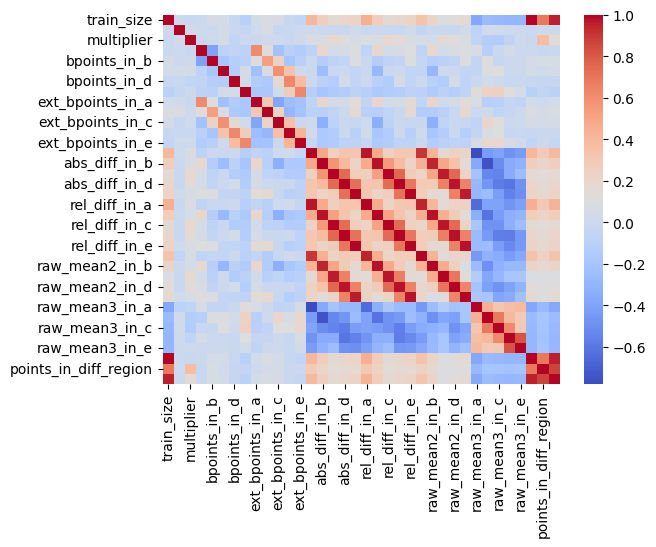

In [210]:
sns.heatmap(df.corr(numeric_only=True), cmap="coolwarm")

In [211]:
df.to_excel("andmed\\uneven_all.xlsx")

In [249]:
df.columns

Index(['train_size', 'random_seed', 'multiplier', 'region', 'bpoints_in_a',
       'bpoints_in_b', 'bpoints_in_c', 'bpoints_in_d', 'bpoints_in_e',
       'ext_bpoints_in_a', 'ext_bpoints_in_b', 'ext_bpoints_in_c',
       'ext_bpoints_in_d', 'ext_bpoints_in_e', 'abs_diff_in_a',
       'abs_diff_in_b', 'abs_diff_in_c', 'abs_diff_in_d', 'abs_diff_in_e',
       'rel_diff_in_a', 'rel_diff_in_b', 'rel_diff_in_c', 'rel_diff_in_d',
       'rel_diff_in_e', 'raw_mean2_in_a', 'raw_mean2_in_b', 'raw_mean2_in_c',
       'raw_mean2_in_d', 'raw_mean2_in_e', 'raw_mean3_in_a', 'raw_mean3_in_b',
       'raw_mean3_in_c', 'raw_mean3_in_d', 'raw_mean3_in_e',
       'points_in_equal_regions', 'points_in_diff_region', 'total_points'],
      dtype='object')

## Joonistame!

### train_size, total_points, multiplier, region, points_in_equal_regions, points_in_diff_region

### bpoints_in, ext_bpoints_in, abs_diff_in, rel_diff_in, raw_mean2, raw_mean3

In [499]:
big_df = df.copy()
# võtame keskmise üle meie kolme suure parameetri (keskmistame random seedid välja pmst)
df = df.groupby(['region', 'multiplier', 'train_size']).mean().reset_index()

In [441]:
df = big_df.groupby(['region', 'multiplier', 'train_size']).mean().reset_index()

In [442]:
df.head()

,region,multiplier,train_size,random_seed,bpoints_in_a,bpoints_in_b,bpoints_in_c,bpoints_in_d,bpoints_in_e,ext_bpoints_in_a,...,raw_mean2_in_d,raw_mean2_in_e,raw_mean3_in_a,raw_mean3_in_b,raw_mean3_in_c,raw_mean3_in_d,raw_mean3_in_e,points_in_equal_regions,points_in_diff_region,total_points
0,A,0.25,10,2.0,7.0,4.6,2.4,0.4,0.0,13.6,...,0.975585,0.557305,0.667044,1.189238,1.841209,2.400548,2.854592,2.0,0.0,8.0
1,A,0.25,20,2.0,5.6,2.4,0.6,0.2,0.0,11.2,...,2.254769,2.780720,0.596274,1.006193,1.544099,2.174497,2.775782,4.0,1.0,17.0
2,A,0.25,30,2.0,3.4,6.6,1.8,0.0,0.0,11.6,...,2.252303,2.615842,0.489134,1.159714,1.536453,2.235472,3.084342,6.0,1.0,25.0
3,A,0.25,40,2.0,6.6,4.8,1.6,0.2,0.2,13.2,...,1.369364,1.822075,0.549896,1.091912,1.580449,2.259144,3.000289,8.0,2.0,34.0
4,A,0.25,50,2.0,6.6,2.6,1.4,0.6,0.0,13.4,...,1.715328,2.391290,0.632477,1.036879,1.562713,2.156092,2.772477,10.0,2.0,42.0


<AxesSubplot: xlabel='total_points', ylabel='Count'>

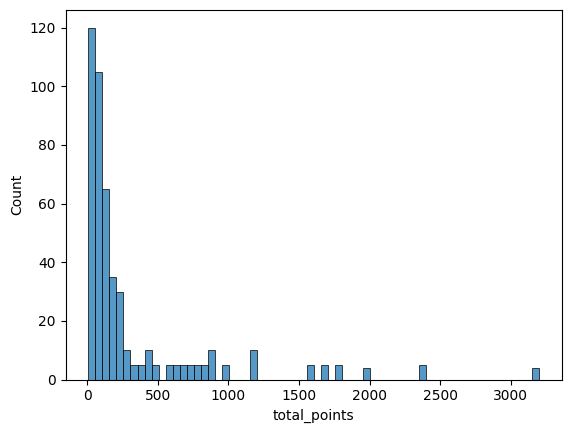

In [262]:
sns.histplot(data=df, x ="total_points",)

<AxesSubplot: xlabel='abs_diff_in_a', ylabel='raw_mean3_in_a'>

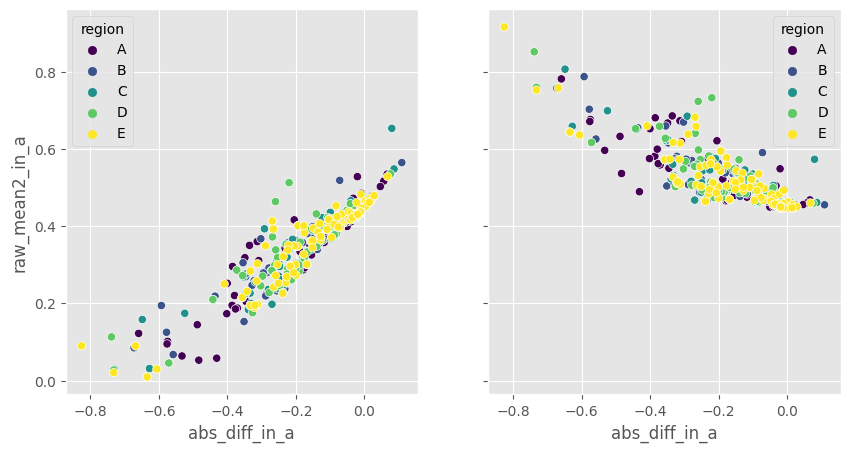

In [500]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5), sharex=True, sharey=True)
# ax[0].set_xlim([-1, 0.5])
# ax[1].set_xlim([-1, 0.5])
# ax[0].set_ylim([0, 1.5])
# ax[1].set_ylim([0, 1.5])
sns.scatterplot(ax=ax[0], data=df, x="abs_diff_in_a",y="raw_mean2_in_a", hue="region",)
sns.scatterplot(ax=ax[1], data=df, x="abs_diff_in_a",y="raw_mean3_in_a", hue="region",)

Text(0.5, 1.0, 'Kui muudatused on ainult A piirkonnas, kuidas siis muutuvad abs ja rel teistes piirkondades')

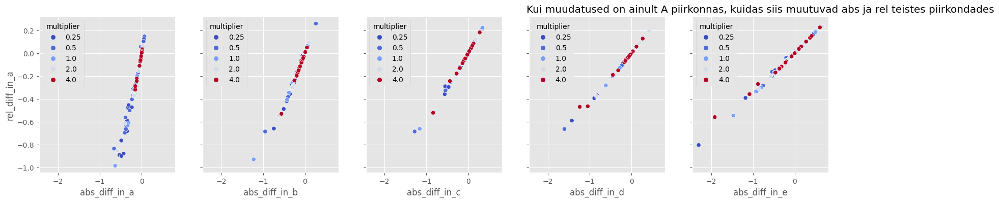

In [501]:
fig, ax = plt.subplots(1, 5, figsize=(20, 4), sharex=True, sharey=True)

sns.scatterplot(ax=ax[0], data=df[df['region'] == 'A'], x="abs_diff_in_a", y="rel_diff_in_a", hue="multiplier", palette="coolwarm")
sns.scatterplot(ax=ax[1], data=df[df['region'] == 'A'], x="abs_diff_in_b", y="rel_diff_in_b", hue="multiplier", palette="coolwarm")
sns.scatterplot(ax=ax[2], data=df[df['region'] == 'A'], x="abs_diff_in_c", y="rel_diff_in_c", hue="multiplier", palette="coolwarm")
sns.scatterplot(ax=ax[3], data=df[df['region'] == 'A'], x="abs_diff_in_d", y="rel_diff_in_d", hue="multiplier", palette="coolwarm")
sns.scatterplot(ax=ax[4], data=df[df['region'] == 'A'], x="abs_diff_in_e", y="rel_diff_in_e", hue="multiplier", palette="coolwarm")
plt.title("Kui muudatused on ainult A piirkonnas, kuidas siis muutuvad abs ja rel teistes piirkondades")

In [502]:
df.columns

Index(['region', 'multiplier', 'train_size', 'random_seed', 'bpoints_in_a',
       'bpoints_in_b', 'bpoints_in_c', 'bpoints_in_d', 'bpoints_in_e',
       'ext_bpoints_in_a', 'ext_bpoints_in_b', 'ext_bpoints_in_c',
       'ext_bpoints_in_d', 'ext_bpoints_in_e', 'abs_diff_in_a',
       'abs_diff_in_b', 'abs_diff_in_c', 'abs_diff_in_d', 'abs_diff_in_e',
       'rel_diff_in_a', 'rel_diff_in_b', 'rel_diff_in_c', 'rel_diff_in_d',
       'rel_diff_in_e', 'raw_mean2_in_a', 'raw_mean2_in_b', 'raw_mean2_in_c',
       'raw_mean2_in_d', 'raw_mean2_in_e', 'raw_mean3_in_a', 'raw_mean3_in_b',
       'raw_mean3_in_c', 'raw_mean3_in_d', 'raw_mean3_in_e',
       'points_in_equal_regions', 'points_in_diff_region', 'total_points'],
      dtype='object')

In [503]:
sns.set_palette("viridis")
plt.style.use('ggplot')
plt.rcParams["image.cmap"] = "viridis"
plt.rcParams['axes.prop_cycle'] = plt.cycler(color=plt.cm.viridis(np.linspace(0, 1, 5)))

<AxesSubplot: xlabel='abs_diff_in_e', ylabel='points_in_equal_regions'>

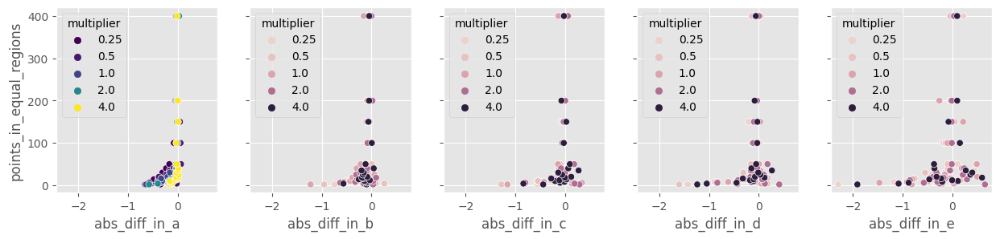

In [504]:
fig, ax = plt.subplots(1, 5, figsize=(15, 3), sharex=True, sharey=True)

# ax[0].set_xscale("log")

sns.scatterplot(ax=ax[0], data=df[df['region'] == 'A'], x="abs_diff_in_a", y="points_in_equal_regions", hue="multiplier", palette="viridis" )
sns.scatterplot(ax=ax[1], data=df[df['region'] == 'A'], x="abs_diff_in_b", y="points_in_equal_regions", hue="multiplier", )
sns.scatterplot(ax=ax[2], data=df[df['region'] == 'A'], x="abs_diff_in_c", y="points_in_equal_regions", hue="multiplier", )
sns.scatterplot(ax=ax[3], data=df[df['region'] == 'A'], x="abs_diff_in_d", y="points_in_equal_regions", hue="multiplier", )
sns.scatterplot(ax=ax[4], data=df[df['region'] == 'A'], x="abs_diff_in_e", y="points_in_equal_regions", hue="multiplier", )
#plt.title("Kui muudatused on ainult A piirkonnas, kuidas siis muutuvad abs ja rel teistes piirkondades")

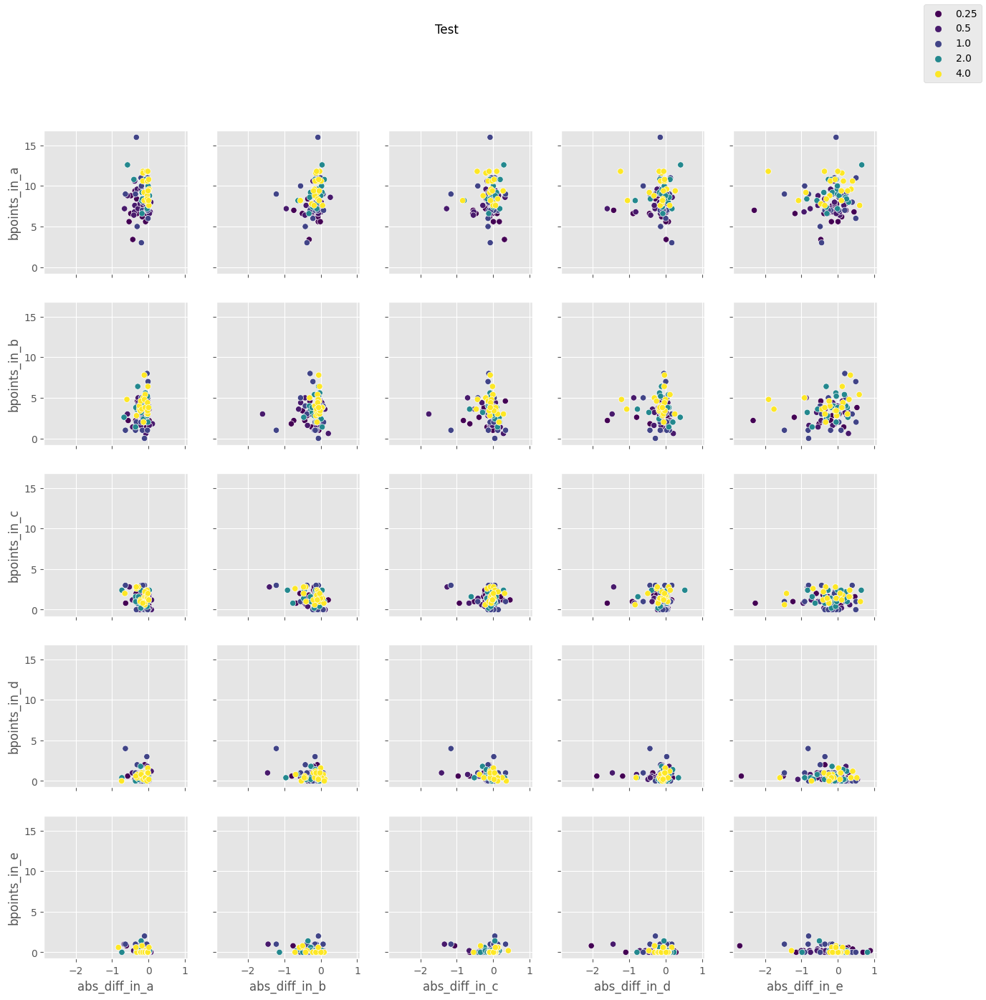

In [505]:
def megaplotty(x_axis_data,x_letter, y_axis_data, y_letter, df, hue='multiplier', title="", save=False):

    fig, ax = plt.subplots(5, 5, figsize=(15, 15), sharex=True, sharey=True)

    # ax[0].set_xscale("log")
    for i in range(5):
        for j in range(5):
            if x_letter:
                x = x_axis_data+chr(97+j)
            else:
                x = x_axis_data
            if y_letter:
                y = y_axis_data+chr(97+i)
            else:
                y = y_axis_data
            #print(x, y)
            #print(f"Subplot {i}, {j} saab endale {x} ja {y}, koos region {chr(65+i)}")
            sns.scatterplot(ax=ax[i, j], data=df[df['region'] == chr(65+i)], x=x, y=y, hue=hue, palette="viridis" )
            #ax[i, j].set_title(f"abs_diff_in_{chr(97+i)}")
            
            handles, labels = ax[i,j].get_legend_handles_labels() # võtab legendi ja salvestab ära, tegelikult võib ka lõpus korra teha seda
            ax[i,j].get_legend().remove()   # et iga subplot ei kuvaks sama legendi

    fig.legend(handles, labels, loc='upper right')

    plt.suptitle(title)
    # sns.scatterplot(ax=ax[0], data=df[df['region'] == 'A'], x="abs_diff_in_a", y="points_in_equal_regions", hue="multiplier", palette="viridis" )
    # sns.scatterplot(ax=ax[1], data=df[df['region'] == 'A'], x="abs_diff_in_b", y="points_in_equal_regions", hue="multiplier", )
    # sns.scatterplot(ax=ax[2], data=df[df['region'] == 'A'], x="abs_diff_in_c", y="points_in_equal_regions", hue="multiplier", )
    # sns.scatterplot(ax=ax[3], data=df[df['region'] == 'A'], x="abs_diff_in_d", y="points_in_equal_regions", hue="multiplier", )
    # sns.scatterplot(ax=ax[4], data=df[df['region'] == 'A'], x="abs_diff_in_e", y="points_in_equal_regions", hue="multiplier", )
    # sns.scatterplot(ax=ax[5], data=df[df['region'] == 'A'], x="abs_diff_in_e", y="points_in_equal_regions", hue="multiplier", )

    #plt.title("Kui muudatused on ainult A piirkonnas, kuidas siis muutuvad abs ja rel teistes piirkondades")
    if save:
        plt.savefig(f"plots/ilusad/{title}.jpeg", dpi=300)

megaplotty('abs_diff_in_',True, 'bpoints_in_',True ,df, hue='multiplier', title="Test", save=True)

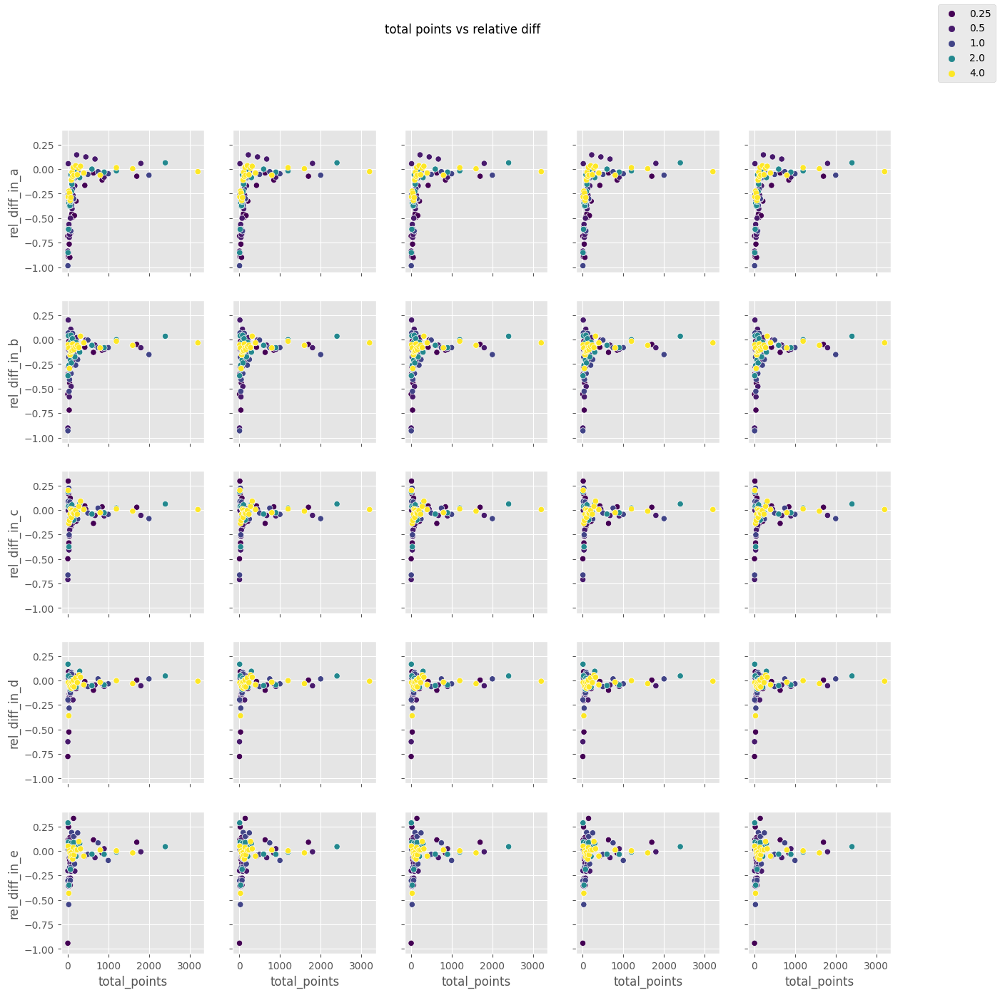

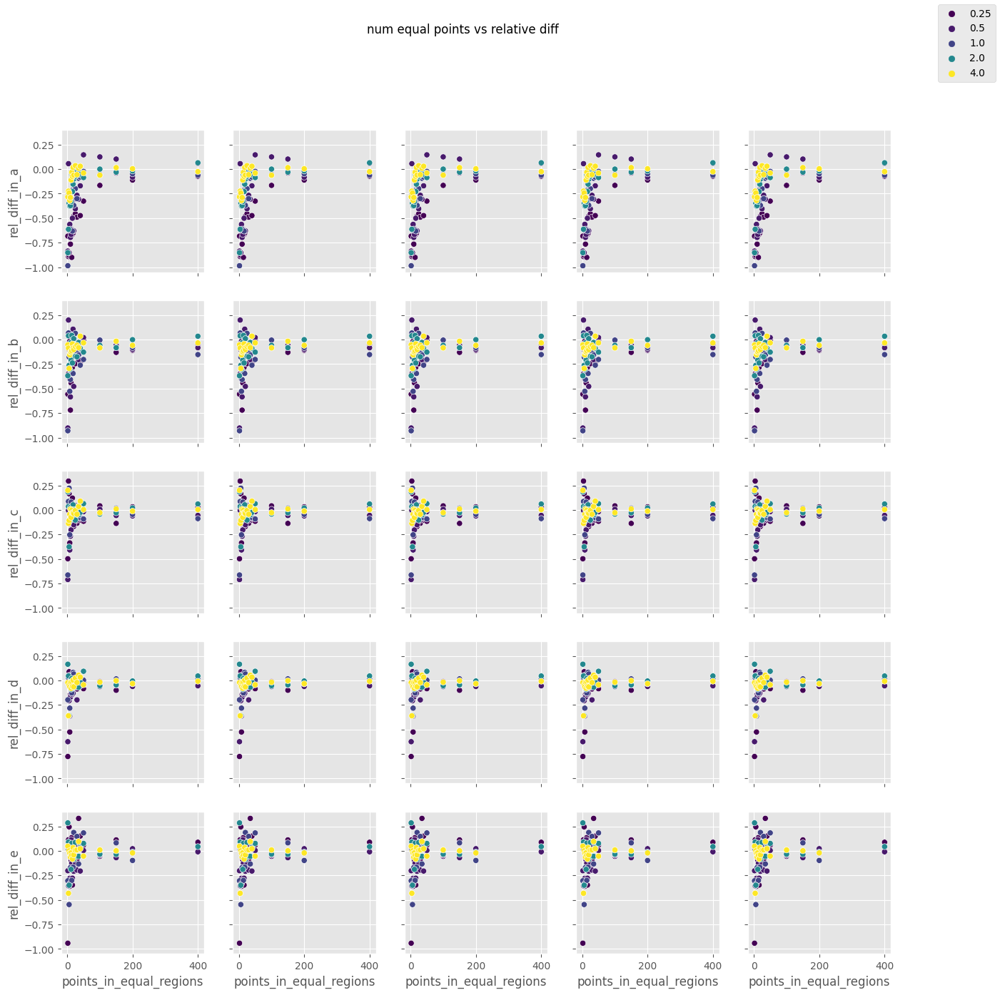

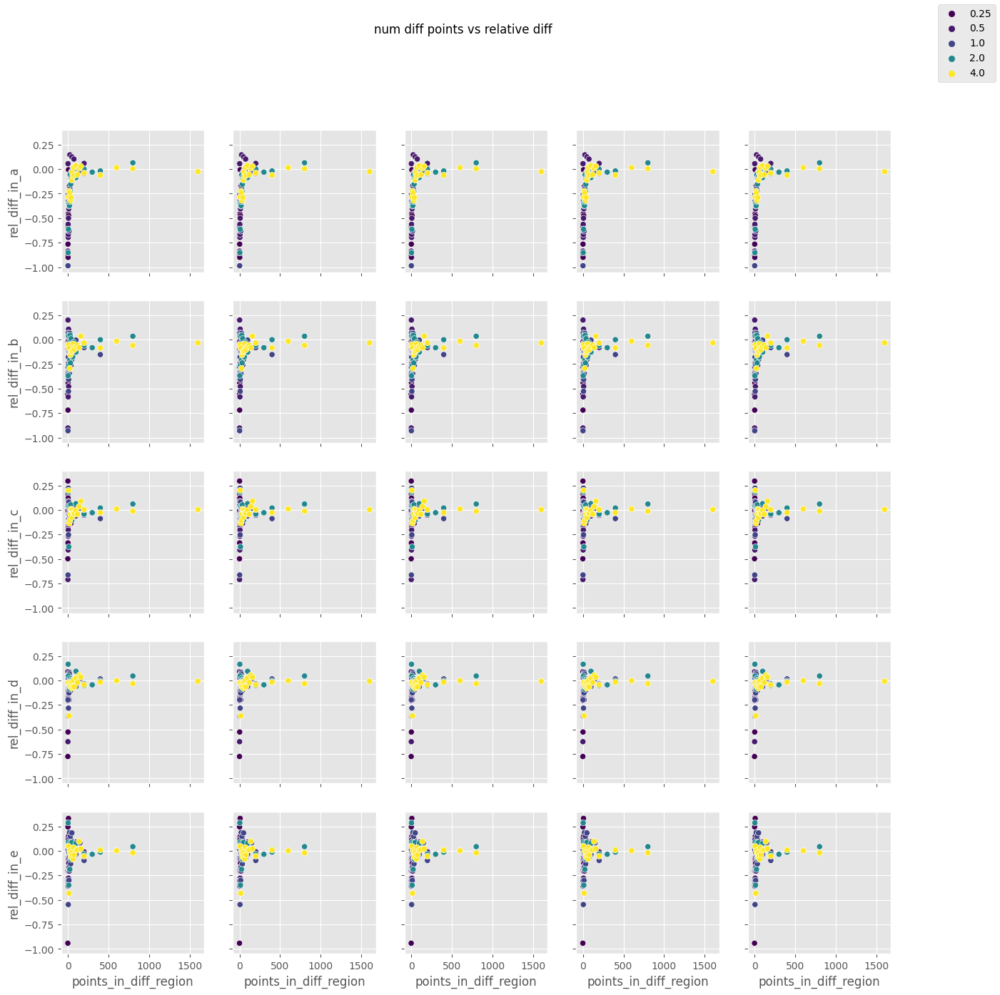

In [506]:
megaplotty('total_points',False, 'rel_diff_in_',True ,df, hue='multiplier', title="total points vs relative diff", save=True)
megaplotty('points_in_equal_regions',False, 'rel_diff_in_',True ,df, hue='multiplier', title="num equal points vs relative diff", save=True)
megaplotty('points_in_diff_region',False, 'rel_diff_in_',True ,df, hue='multiplier', title="num diff points vs relative diff", save=True)

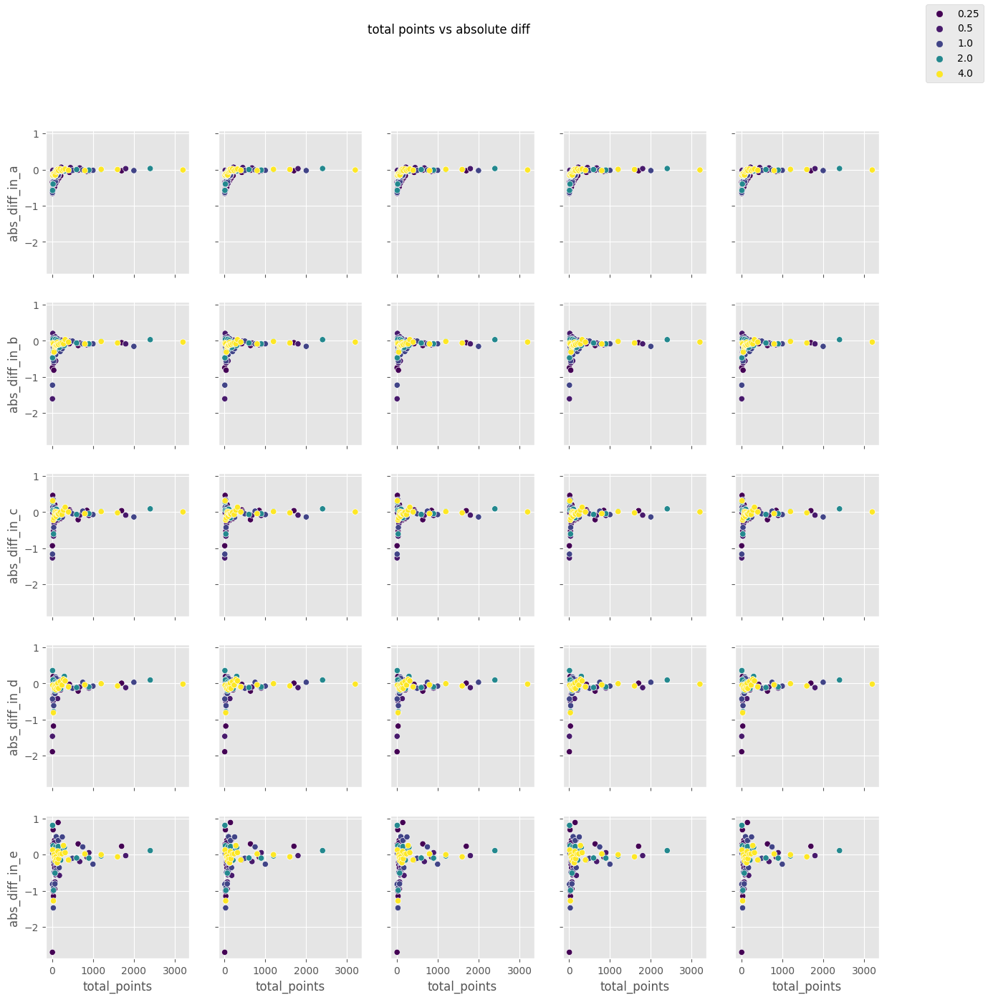

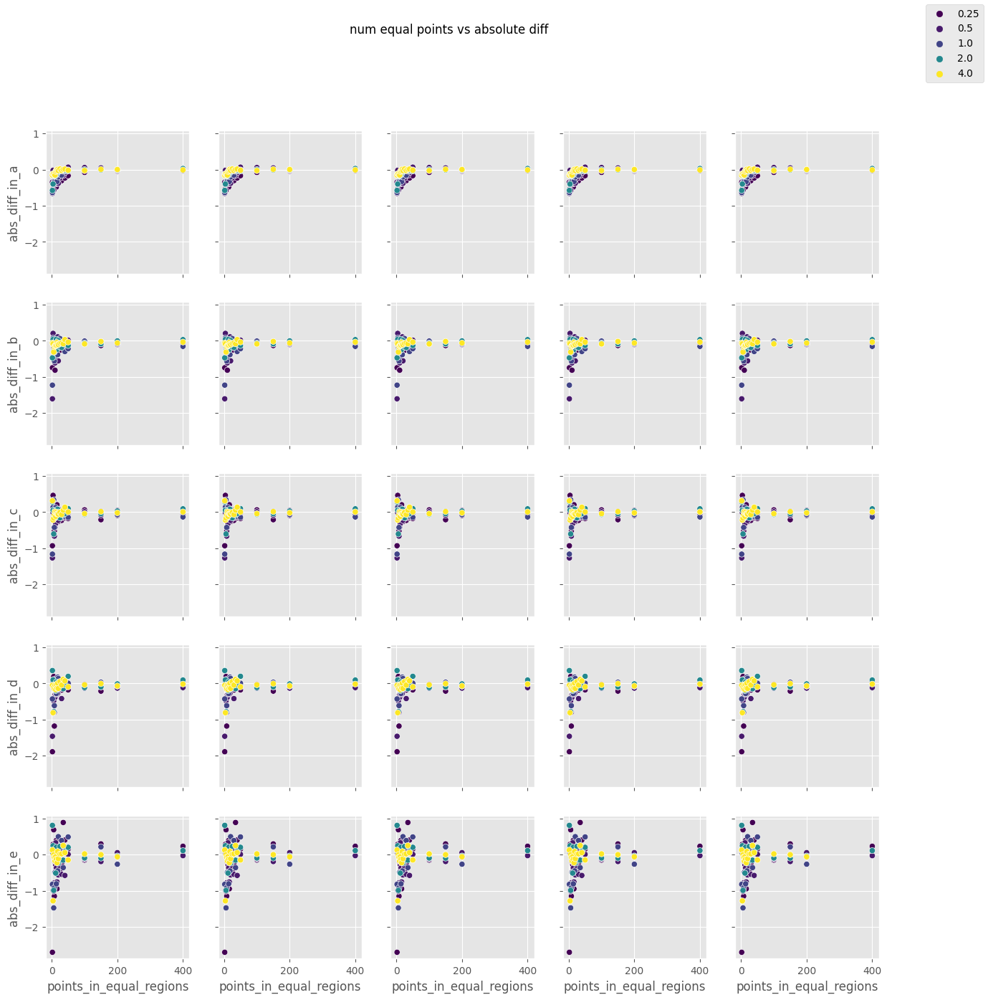

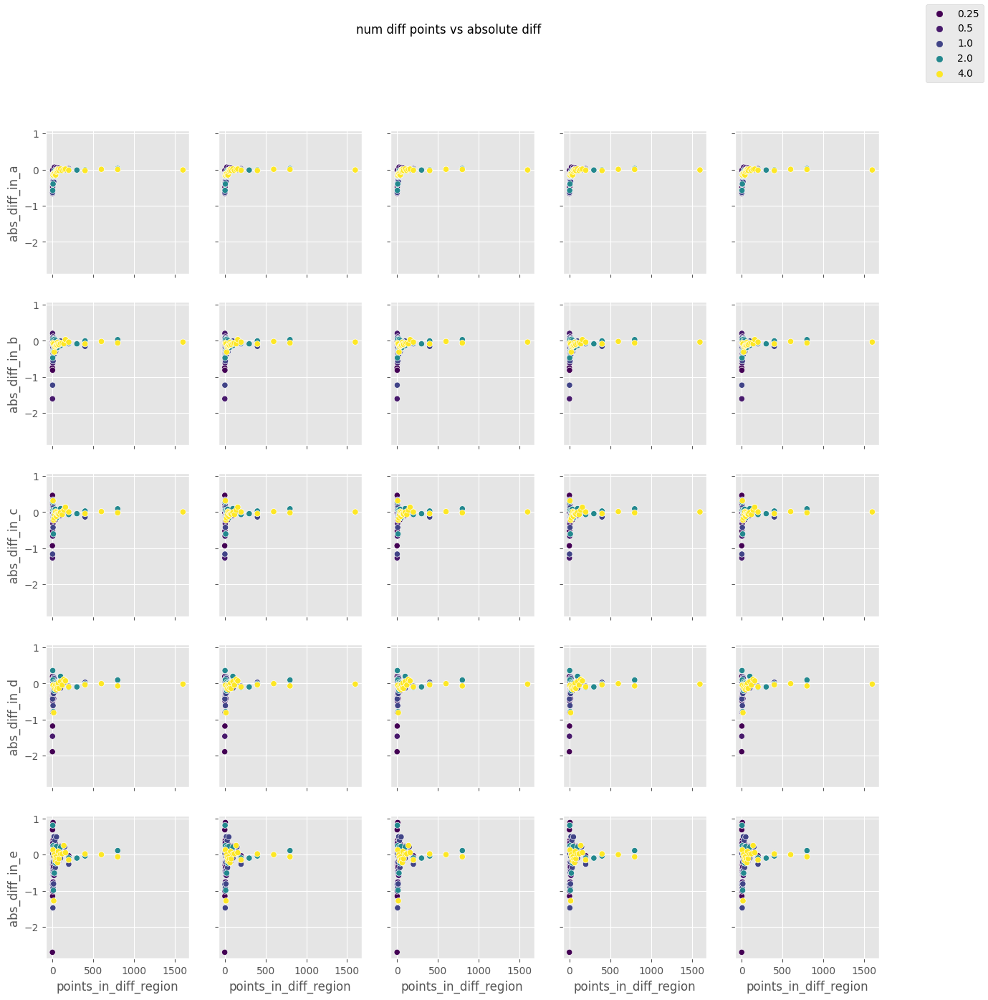

In [507]:
megaplotty('total_points',False, 'abs_diff_in_',True ,df, hue='multiplier', title="total points vs absolute diff", save=True)
megaplotty('points_in_equal_regions',False, 'abs_diff_in_',True ,df, hue='multiplier', title="num equal points vs absolute diff", save=True)
megaplotty('points_in_diff_region',False, 'abs_diff_in_',True ,df, hue='multiplier', title="num diff points vs absolute diff", save=True)

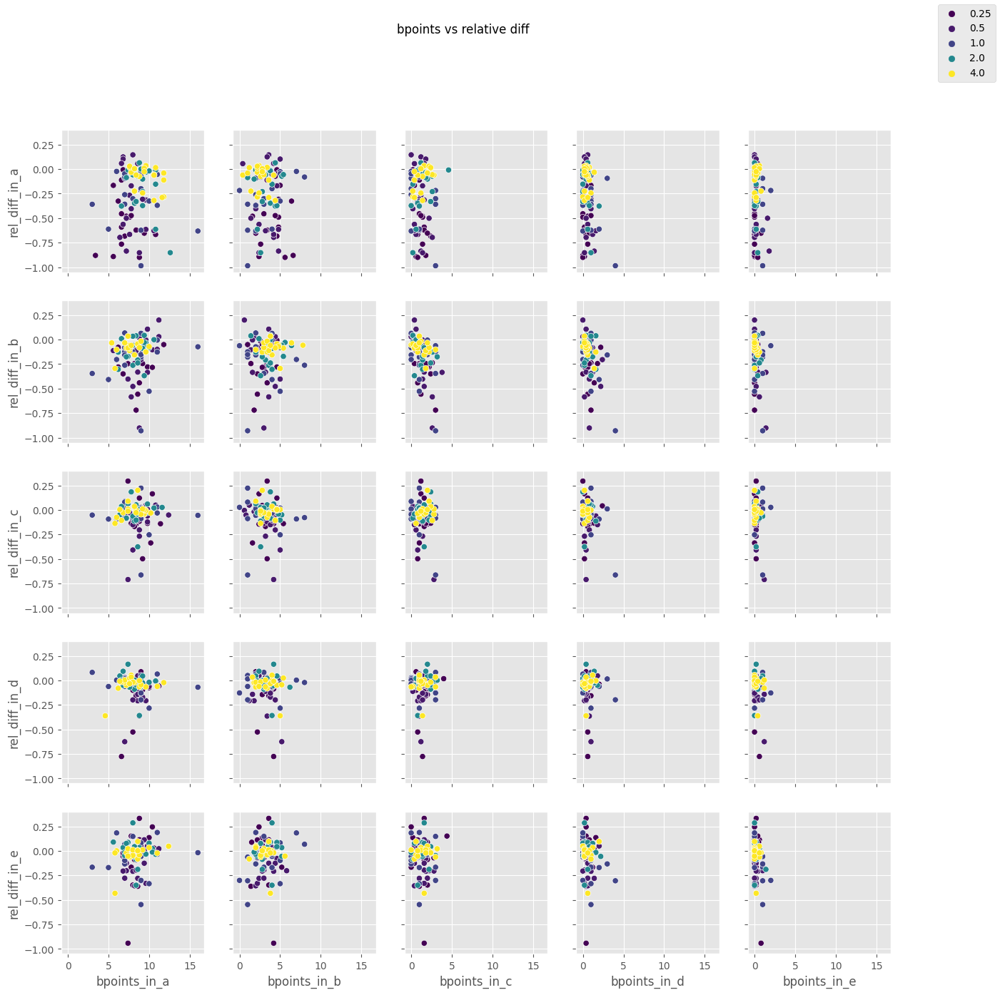

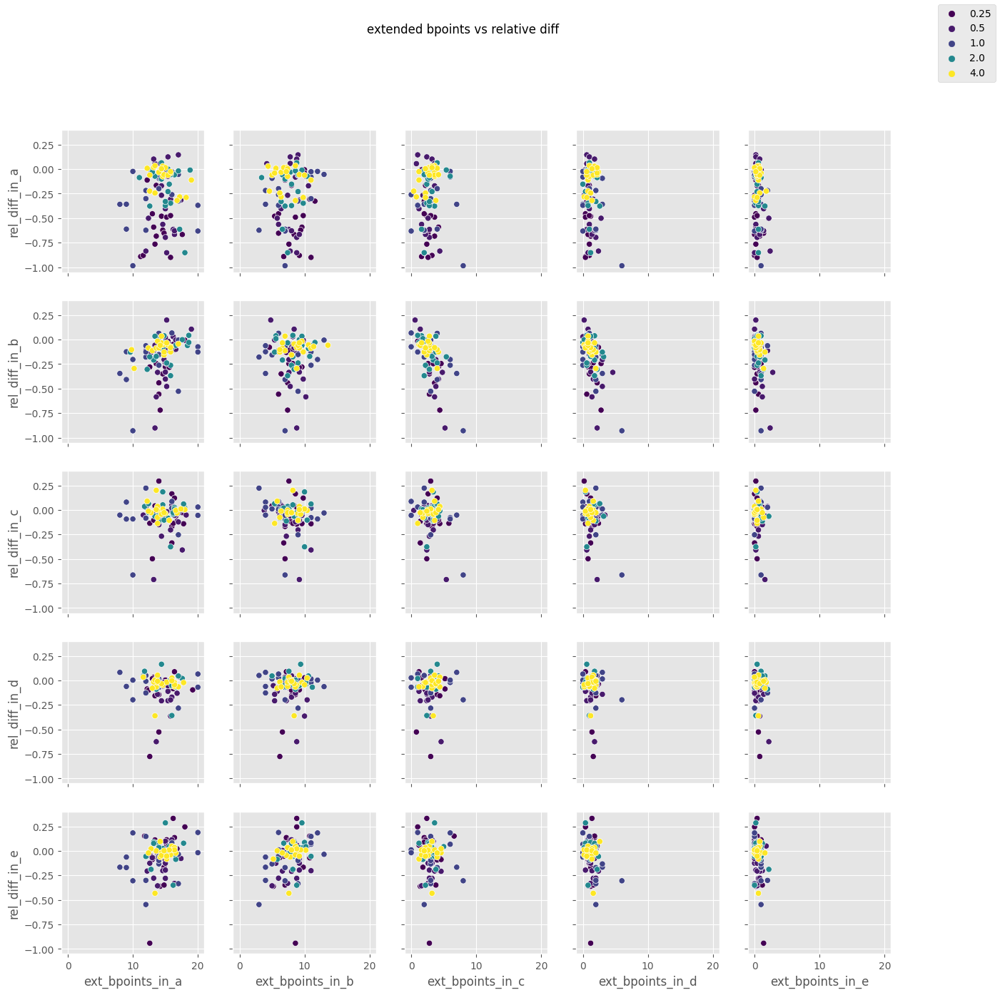

In [508]:
megaplotty('bpoints_in_',True, 'rel_diff_in_',True ,df, hue='multiplier', title="bpoints vs relative diff", save=True)
megaplotty('ext_bpoints_in_',True, 'rel_diff_in_',True ,df, hue='multiplier', title="extended bpoints vs relative diff", save=True)

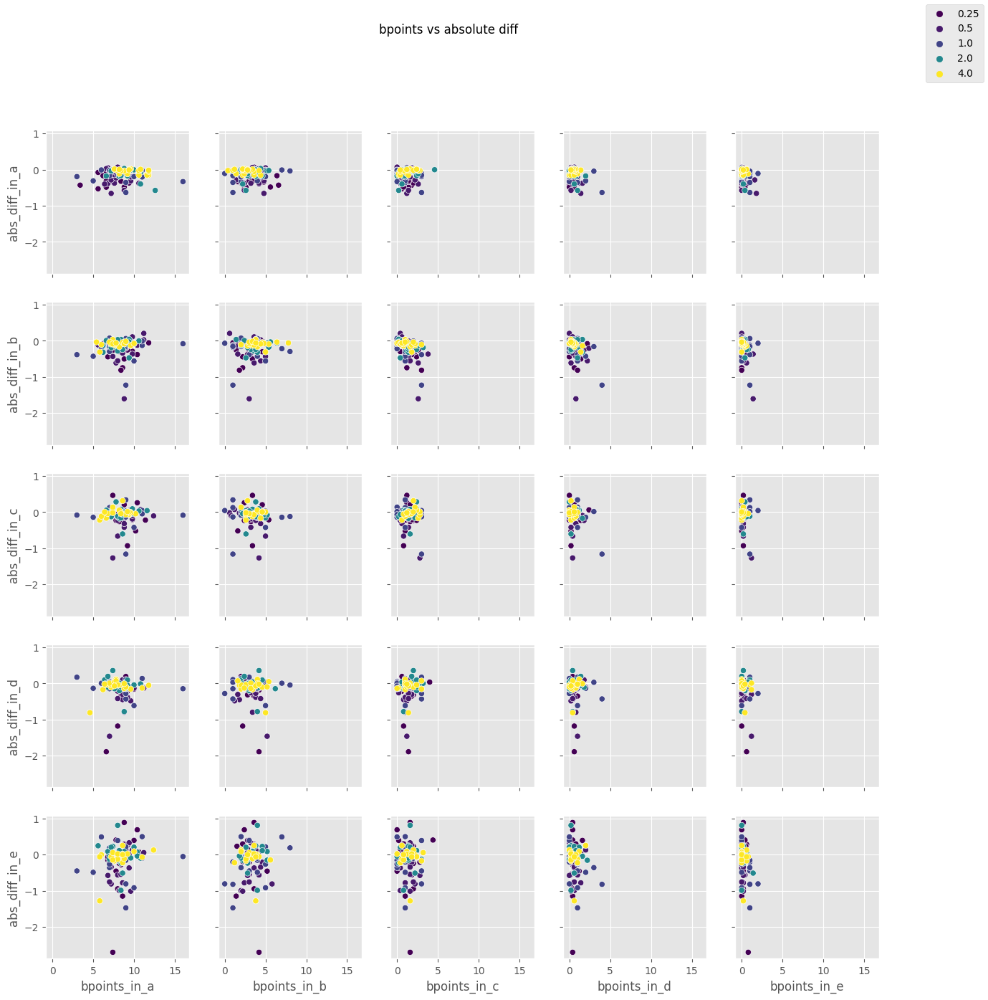

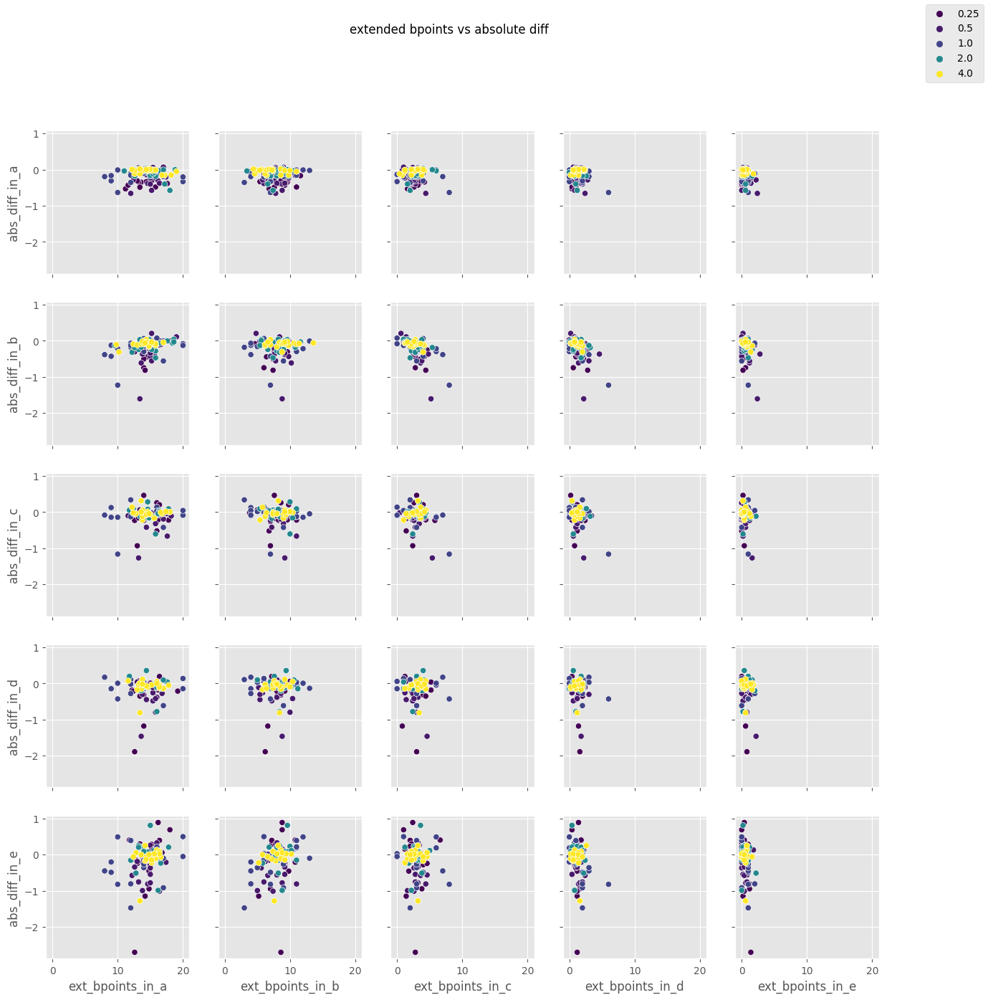

In [509]:
megaplotty('bpoints_in_',True, 'abs_diff_in_',True ,df, hue='multiplier', title="bpoints vs absolute diff", save=True)
megaplotty('ext_bpoints_in_',True, 'abs_diff_in_',True ,df, hue='multiplier', title="extended bpoints vs absolute diff", save=True)

In [510]:
df.to_excel("andmed\\uneven_all_avgs.xlsx")

PermissionError: [Errno 13] Permission denied: 'andmed\\uneven_all_avgs.xlsx'

In [ ]:
pd.melt(df, ["region"])
hue = "raw_mean3_d"

,region,variable,value
0,A,multiplier,0.25
1,A,multiplier,0.25
2,A,multiplier,0.25
3,A,multiplier,0.25
4,A,multiplier,0.25
...,...,...,...
17023,E,total_points,320.00
17024,E,total_points,400.00
17025,E,total_points,800.00
17026,E,total_points,1200.00


In [511]:
sns.lineplot(data=pd.melt(df, ["region"]), x="region", y="raw_mean3_d",)
plt.legend(loc='upper right')

ValueError: Could not interpret value `raw_mean3_d` for parameter `y`

In [ ]:
df.columns

Index(['region', 'multiplier', 'train_size', 'random_seed', 'bpoints_in_a',
       'bpoints_in_b', 'bpoints_in_c', 'bpoints_in_d', 'bpoints_in_e',
       'ext_bpoints_in_a', 'ext_bpoints_in_b', 'ext_bpoints_in_c',
       'ext_bpoints_in_d', 'ext_bpoints_in_e', 'abs_diff_in_a',
       'abs_diff_in_b', 'abs_diff_in_c', 'abs_diff_in_d', 'abs_diff_in_e',
       'rel_diff_in_a', 'rel_diff_in_b', 'rel_diff_in_c', 'rel_diff_in_d',
       'rel_diff_in_e', 'raw_mean2_in_a', 'raw_mean2_in_b', 'raw_mean2_in_c',
       'raw_mean2_in_d', 'raw_mean2_in_e', 'raw_mean3_in_a', 'raw_mean3_in_b',
       'raw_mean3_in_c', 'raw_mean3_in_d', 'raw_mean3_in_e',
       'points_in_equal_regions', 'points_in_diff_region', 'total_points'],
      dtype='object')

In [512]:
df["combo_name"] = df["train_size"].astype(str) + "_" + df["region"] + "_" + df["multiplier"].astype(str)

In [513]:
lil_df = df[['region', 'multiplier', 'train_size', 'abs_diff_in_a', 'abs_diff_in_b', 'abs_diff_in_c', 'abs_diff_in_d', 'abs_diff_in_e', 'total_points']]

In [514]:
lil_df.head()
lil_df["combo_name"] = lil_df["train_size"].astype(str) + "_" + lil_df["region"] + "_" + lil_df["multiplier"].astype(str)
lil_df.head()

C:\Users\troosma\AppData\Local\Temp\ipykernel_29144\4055688904.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lil_df["combo_name"] = lil_df["train_size"].astype(str) + "_" + lil_df["region"] + "_" + lil_df["multiplier"].astype(str)


,region,multiplier,train_size,abs_diff_in_a,abs_diff_in_b,abs_diff_in_c,abs_diff_in_d,abs_diff_in_e,total_points,combo_name
0,A,0.25,10,-0.348758,-0.741961,-0.550995,-1.424963,-2.297287,8.0,10_A_0.25
1,A,0.25,20,-0.532456,-0.070917,0.169850,0.080272,0.004938,17.0,20_A_0.25
2,A,0.25,30,-0.431093,-0.320756,0.310277,0.016830,-0.468500,25.0,30_A_0.25
3,A,0.25,40,-0.345051,-0.057962,-0.469190,-0.889780,-1.178214,34.0,40_A_0.25
4,A,0.25,50,-0.487747,-0.507475,-0.561553,-0.440764,-0.381187,42.0,50_A_0.25


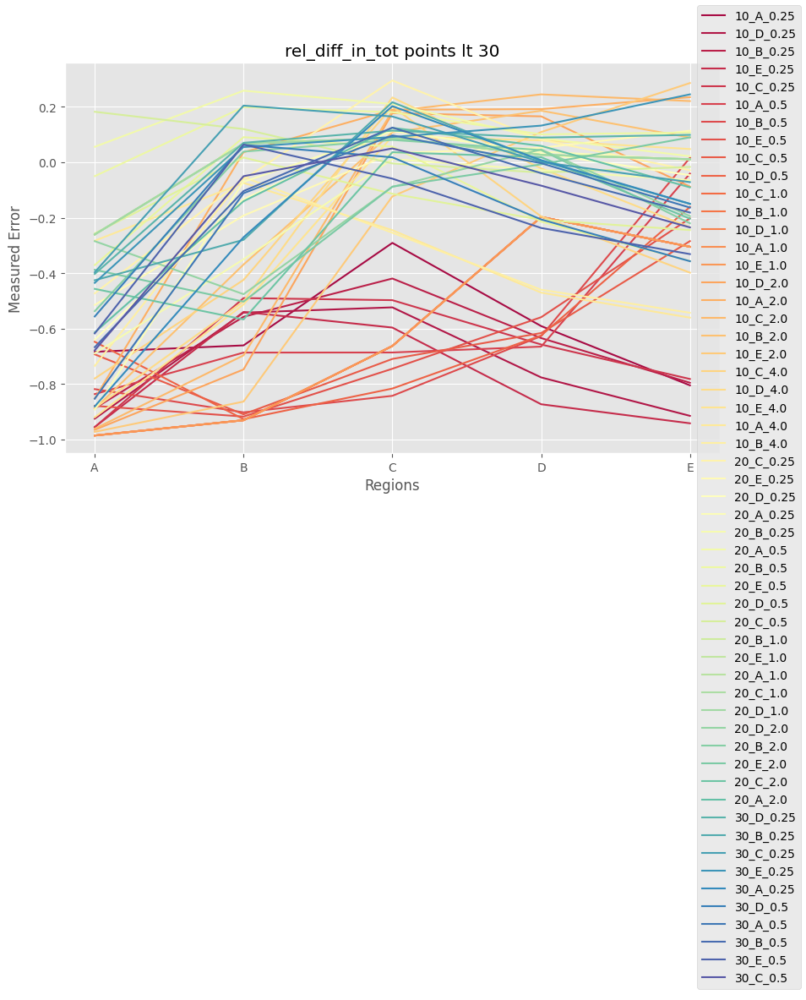

In [516]:
def plotter_2(df, x,title_additional=""):
    regions = ['A', 'B', 'C', 'D', 'E']

    fig, ax = plt.subplots(figsize=(10, 6))
    
    diverging_colors = sns.color_palette("Spectral", df.shape[0])
    # sns.palplot(diverging_colors)

    for i, values in enumerate(df.iterrows()):
        ax.plot(regions, values[1][[*[f"{x}{chr(i+97)}" for i in range(5)]]], label=values[1]["combo_name"], color=diverging_colors[i])
        
        handles, labels = ax.get_legend_handles_labels()

    ax.set_xlabel('Regions')
    ax.set_ylabel('Measured Error')
    ax.set_title(x+title_additional)
    # ax.legend()
    
    fig.legend(handles, labels, loc='upper right')
    
    plt.show()
    fig.savefig(f"plots/ilusad/regions_and_{x}_{title_additional}.jpeg", dpi=300)

test_df = df[df["total_points"]<30].sort_values("total_points")
plotter_2(test_df, "rel_diff_in_", "tot points lt 30")

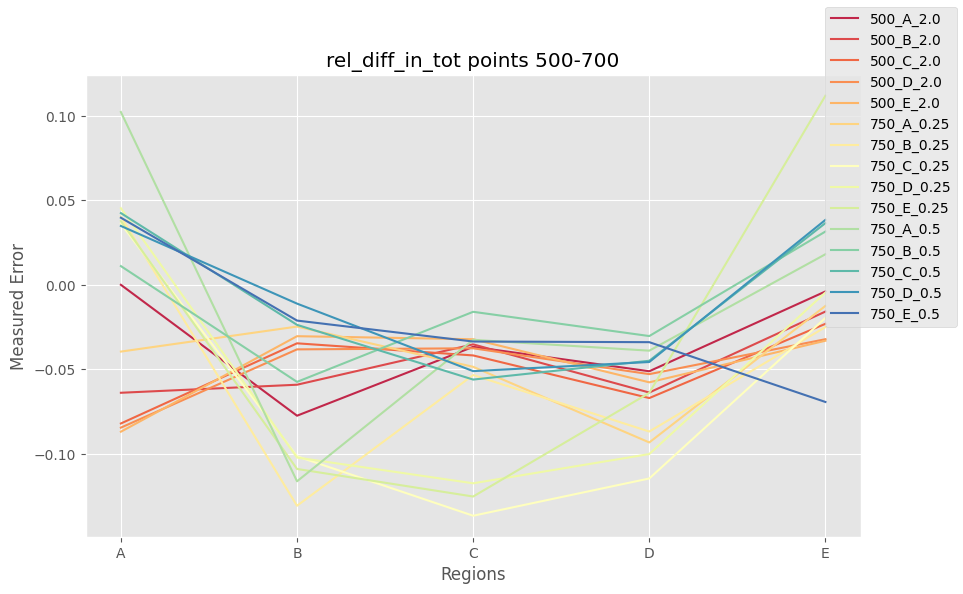

In [518]:
test_df = df[(df["total_points"]>500)&(df["total_points"]<700)].sort_values("total_points")
plotter_2(test_df, "rel_diff_in_", "tot points 500-700")

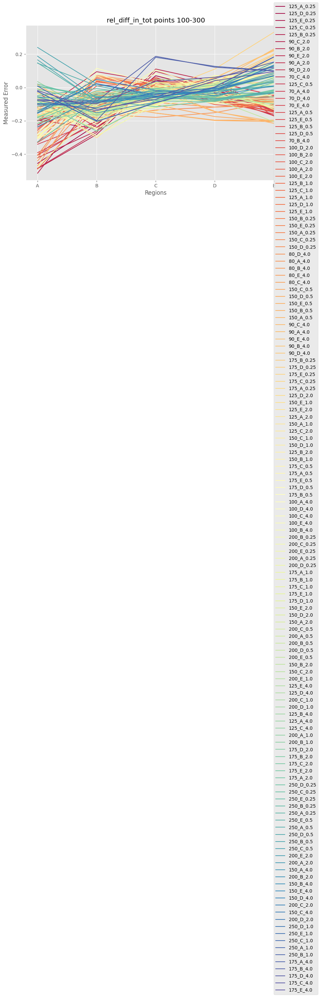

In [519]:
test_df = df[(df["total_points"]>100)&(df["total_points"]<300)].sort_values("total_points")
plotter_2(test_df, "rel_diff_in_", "tot points 100-300")

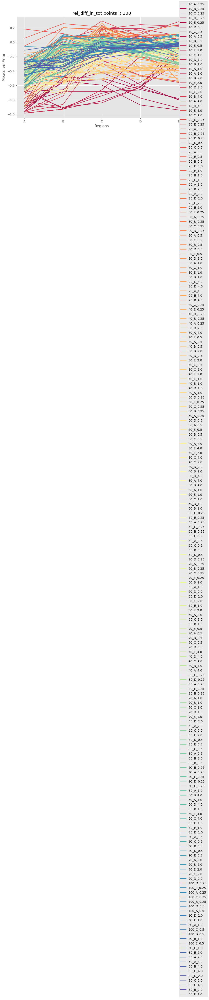

In [520]:
test_df = df[df["total_points"]<100].sort_values("total_points")
plotter_2(test_df, "rel_diff_in_", "tot points lt 100")

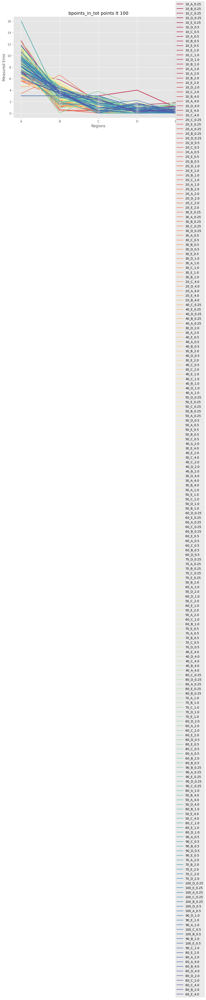

In [521]:
test_df = df[df["total_points"]<100].sort_values("total_points")
plotter_2(test_df, "bpoints_in_", "tot points lt 100")

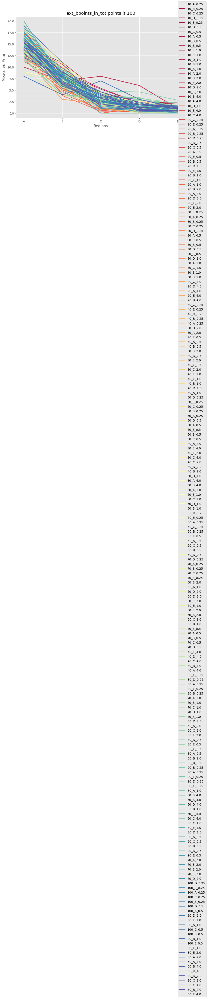

In [522]:
test_df = df[df["total_points"]<100].sort_values("total_points")
plotter_2(test_df, "ext_bpoints_in_", "tot points lt 100")

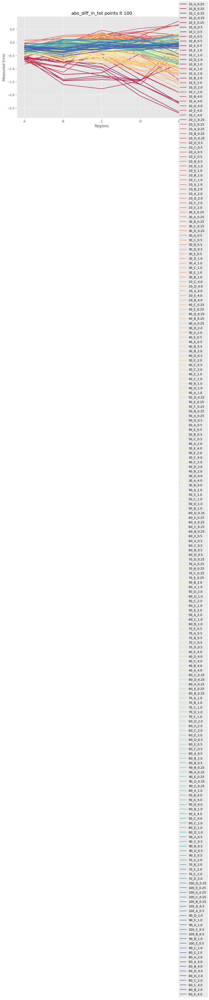

In [523]:
test_df = df[df["total_points"]<100].sort_values("total_points")
plotter_2(test_df, "abs_diff_in_", "tot points lt 100")

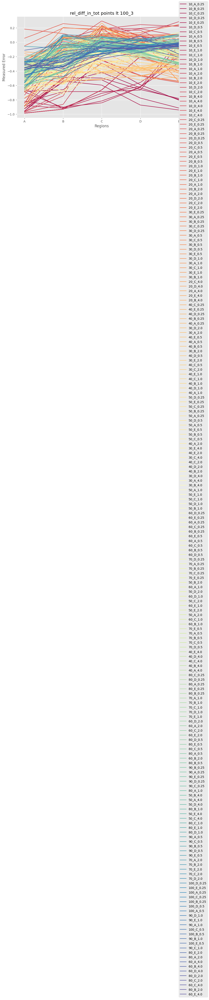

In [524]:
test_df = df[df["total_points"]<100].sort_values("total_points")
plotter_2(test_df, "rel_diff_in_", "tot points lt 100_3")

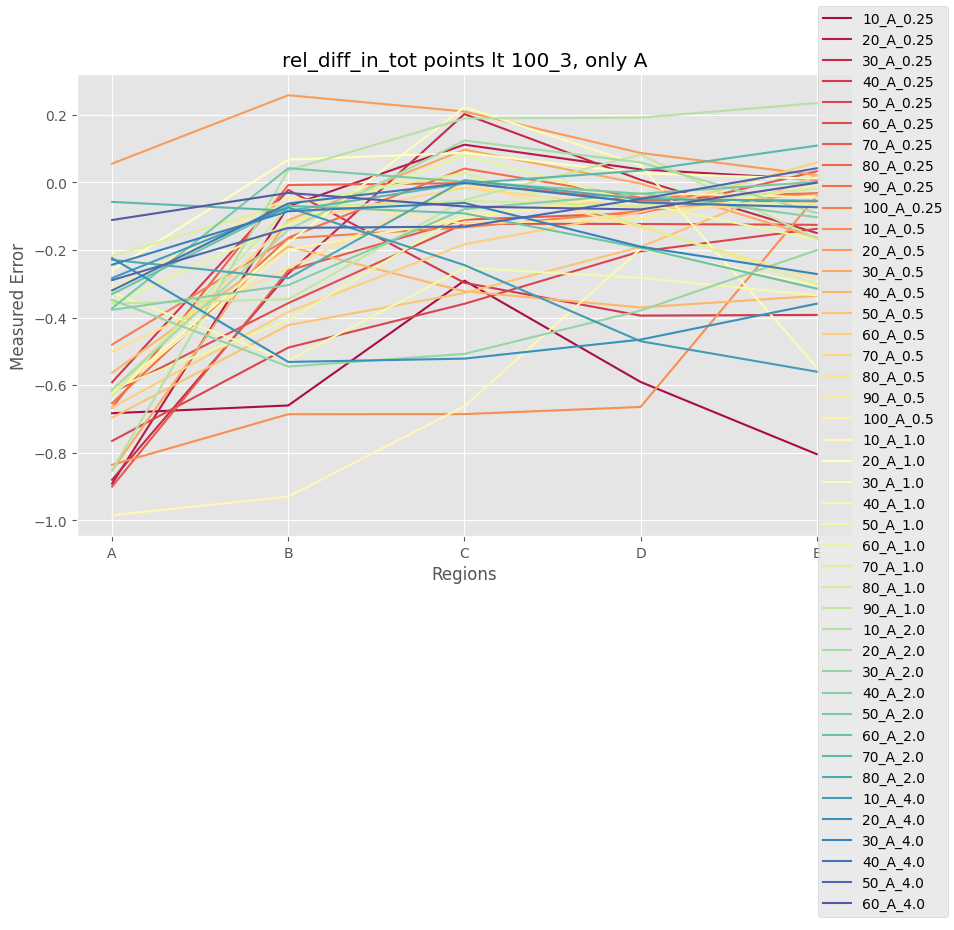

In [525]:
test_df = df[(df["total_points"]<100)&(df["region"]=="A")].sort_values(["multiplier","total_points"])
plotter_2(test_df, "rel_diff_in_", "tot points lt 100_3, only A")

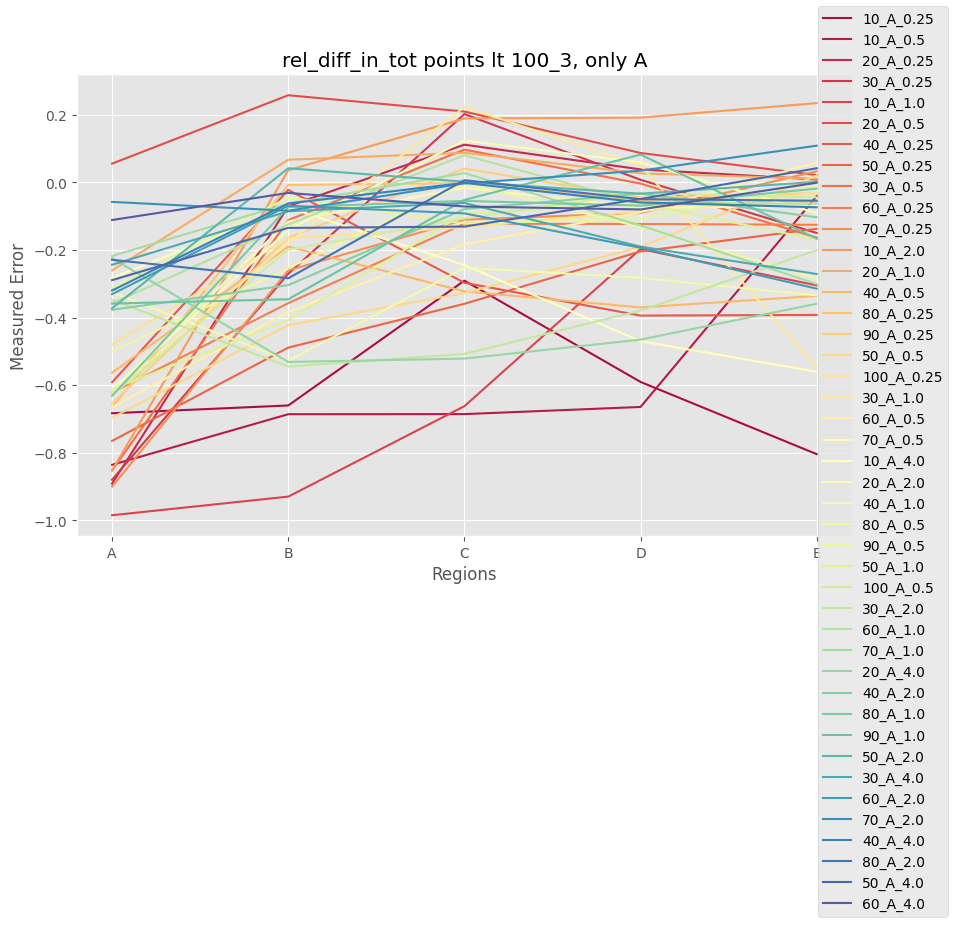

In [526]:
test_df = df[(df["total_points"]<100)&(df["region"]=="A")].sort_values(["points_in_diff_region", "total_points"])
plotter_2(test_df, "rel_diff_in_", "tot points lt 100_3, only A")

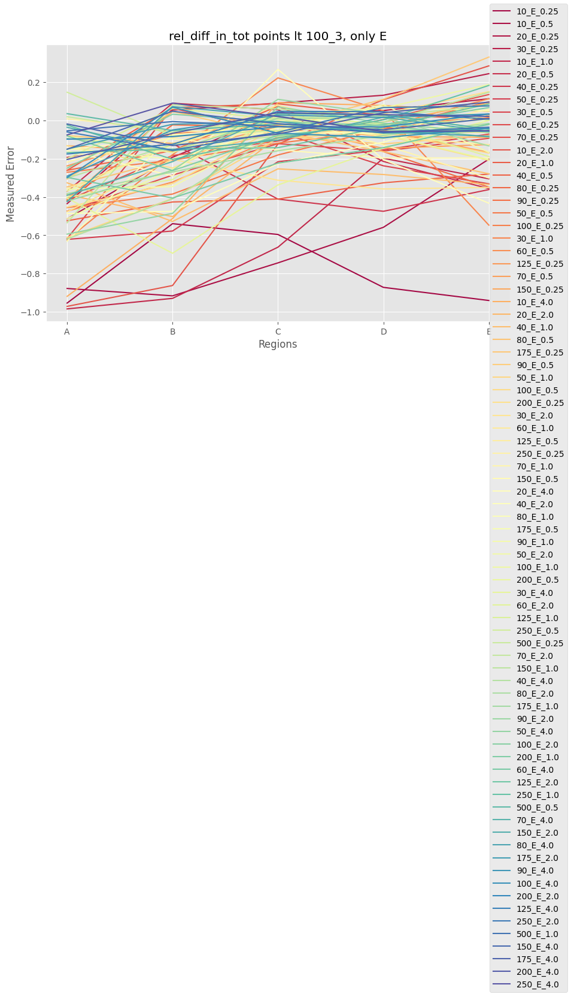

In [527]:
test_df = df[(df["total_points"]<600)&(df["region"]=="E")].sort_values(["points_in_diff_region", "total_points"])
plotter_2(test_df, "rel_diff_in_", "tot points lt 100_3, only E")

In [531]:
test_df[["combo_name", "points_in_diff_region", "total_points"]].tail(20)

,combo_name,points_in_diff_region,total_points
256,100_C_2.0,40.0,120.0
241,200_C_1.0,40.0,200.0
271,60_C_4.0,48.0,96.0
257,125_C_2.0,50.0,150.0
242,250_C_1.0,50.0,250.0
224,500_C_0.5,50.0,450.0
272,70_C_4.0,56.0,112.0
258,150_C_2.0,60.0,180.0
273,80_C_4.0,64.0,128.0
259,175_C_2.0,70.0,210.0


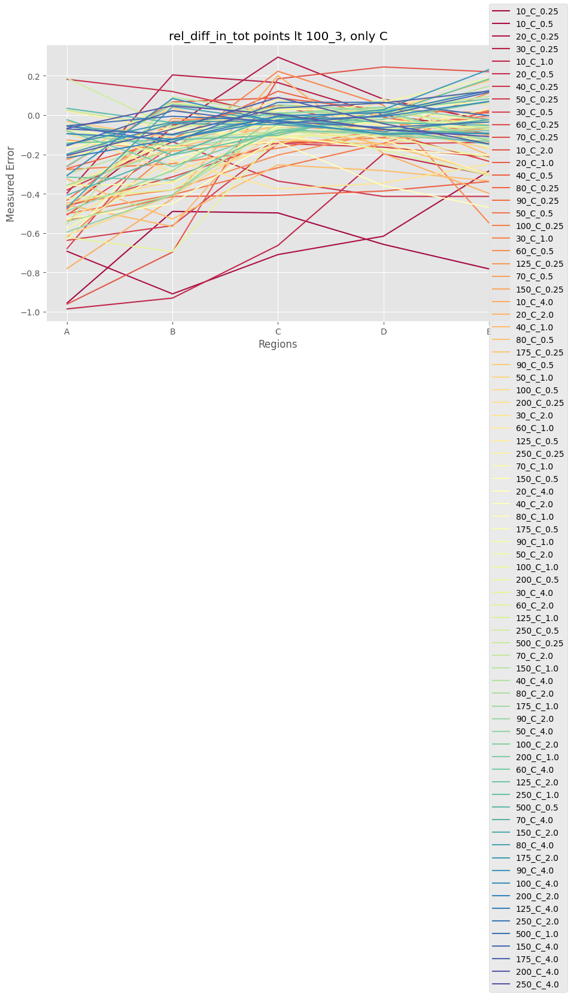

In [528]:
test_df = df[(df["total_points"]<600)&(df["region"]=="C")].sort_values(["points_in_diff_region", "total_points"])
plotter_2(test_df, "rel_diff_in_", "tot points lt 100_3, only C")

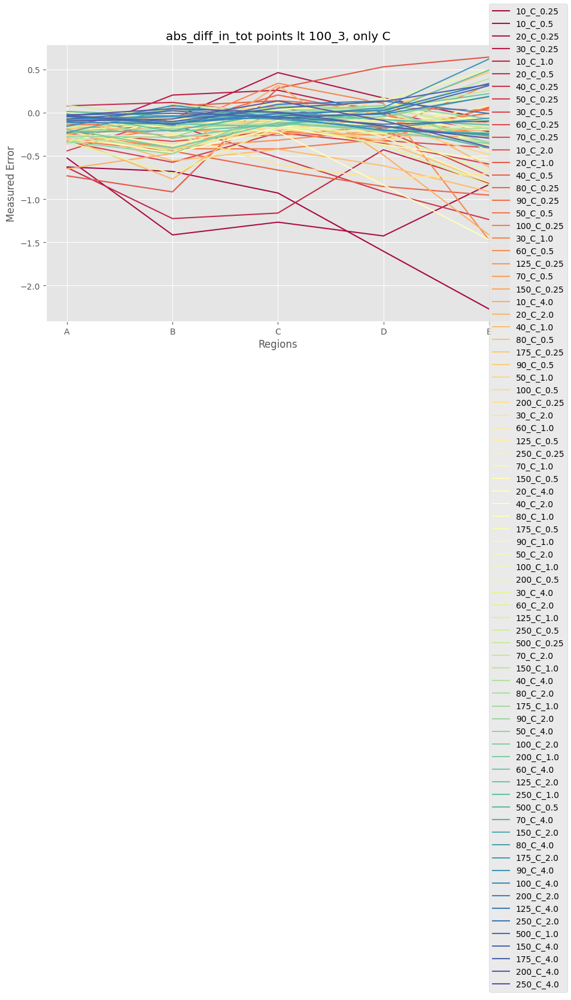

In [529]:
test_df = df[(df["total_points"]<600)&(df["region"]=="C")].sort_values(["points_in_diff_region", "total_points"])
plotter_2(test_df, "abs_diff_in_", "tot points lt 100_3, only C")

In [561]:
def plotter_3(df, y,title_additional=""):
    regions = ['A', 'B', 'C', 'D', 'E']

    fig, ax = plt.subplots(figsize=(10, 6))
    
    diverging_colors = sns.color_palette("Spectral", df.shape[0])
    # sns.palplot(diverging_colors)
    sns.scatterplot(data = df, x="points_in_diff_region_dummy",y=y )
    # for i, values in enumerate(df.iterrows()):
    #     ax.plot(values[1]["points_in_diff_region"], values[1]["abs_diff_in_c"], label=values[1]["combo_name"], color=diverging_colors[i])
        
    #     handles, labels = ax.get_legend_handles_labels()

    # ax.set_xlabel('Regions')
    # ax.set_ylabel('Measured Error')
    # ax.set_title(x+title_additional)
    # # ax.legend()
    
    
    # fig.legend(handles, labels, loc='upper right')
    
    plt.show()
    #fig.savefig(f"plots/ilusad/regions_and_{x}_{title_additional}.jpeg", dpi=300)

#test_df = df[df["total_points"]<600].sort_values("total_points")
#plotter_3(test_df, "abs_diff_in_", "asdf")

In [540]:
round(123, -1)

120

In [582]:
df[(df["points_in_diff_region"]>105)& (df["points_in_diff_region"]<180)&(df['region']=="C")].sort_values("points_in_diff_region")

,region,multiplier,train_size,random_seed,bpoints_in_a,bpoints_in_b,bpoints_in_c,bpoints_in_d,bpoints_in_e,ext_bpoints_in_a,...,raw_mean2_in_e,raw_mean3_in_a,raw_mean3_in_b,raw_mean3_in_c,raw_mean3_in_d,raw_mean3_in_e,points_in_equal_regions,points_in_diff_region,total_points,combo_name
190,C,0.25,10,2.0,9.2,3.4,0.8,0.2,0.2,13.0,...,0.635678,0.658535,1.339262,1.863586,2.438419,2.904865,2.0,0.0,8.0,10_C_0.25
191,C,0.25,20,2.0,7.4,3.4,1.2,0.0,0.2,14.0,...,2.601398,0.483129,1.076877,1.550116,2.113039,2.679669,4.0,1.0,17.0,20_C_0.25
192,C,0.25,30,2.0,10.4,2.4,1.2,0.2,0.0,16.0,...,2.713889,0.640703,1.001415,1.575859,2.232311,2.930126,6.0,1.0,25.0,30_C_0.25
209,C,0.50,10,2.0,7.4,4.2,2.8,0.4,1.2,13.2,...,2.103821,0.698766,1.539854,1.734602,2.280173,2.935017,2.0,1.0,9.0,10_C_0.5
193,C,0.25,40,2.0,10.2,1.6,1.0,0.2,0.0,16.0,...,1.746287,0.559297,1.016089,1.549795,2.206607,2.981028,8.0,2.0,34.0,40_C_0.25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
246,C,1.00,2000,0.0,9.0,1.0,2.0,1.0,0.0,14.0,...,2.757107,0.449534,0.994617,1.511066,2.101735,2.669635,400.0,400.0,2000.0,2000_C_1.0
282,C,4.00,750,2.0,9.2,4.6,1.4,0.2,0.2,17.4,...,2.631643,0.450703,0.992684,1.511447,2.101265,2.674015,150.0,600.0,1200.0,750_C_4.0
265,C,2.00,2000,2.0,9.8,4.2,2.4,0.8,0.2,17.8,...,2.764433,0.450297,0.994737,1.511935,2.106527,2.675101,400.0,800.0,2400.0,2000_C_2.0
283,C,4.00,1000,2.0,7.4,2.6,1.2,0.0,0.2,12.4,...,2.781610,0.447497,0.993805,1.512043,2.101239,2.675767,200.0,800.0,1600.0,1000_C_4.0


In [580]:
test_df = df.copy()
test_df = test_df[(test_df["region"]=="C")&(test_df["multiplier"]==4.0)]
test_df["points_in_diff_region_dummy"] = test_df["points_in_diff_region"].apply(lambda x: round(x/30,0)*30 )
test_df.value_counts("points_in_diff_region_dummy", sort=False)

points_in_diff_region_dummy
0.0       1
30.0      4
60.0      4
90.0      2
120.0     1
150.0     2
210.0     1
390.0     1
600.0     1
810.0     1
1590.0    1
dtype: int64

C:\Users\troosma\AppData\Local\Temp\ipykernel_29144\752737758.py:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  test_df = test_df[(test_df["region"]=="C")&(test_df["multiplier"]==4.0)].groupby(["points_in_diff_region_dummy"]).mean().reset_index()


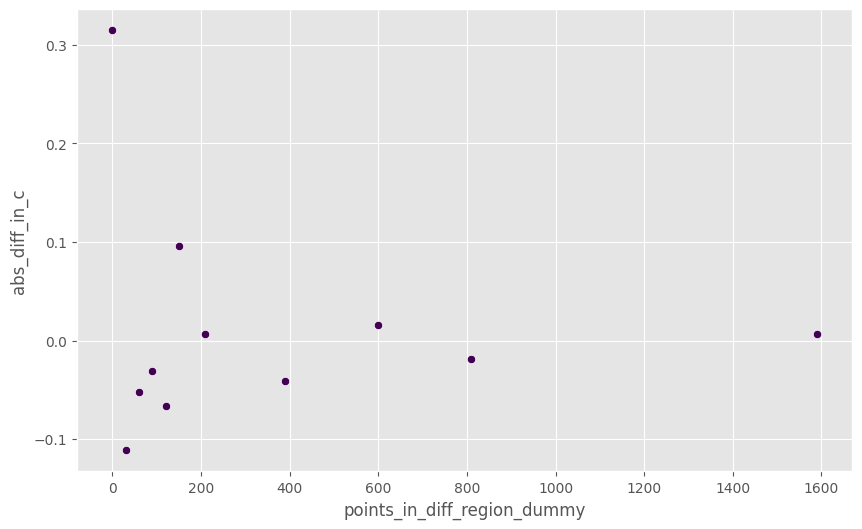

In [579]:
test_df = df.copy()
test_df["points_in_diff_region_dummy"] = test_df["points_in_diff_region"].apply(lambda x: round(x/30,0)*30 )
test_df = test_df[(test_df["region"]=="C")&(test_df["multiplier"]==4.0)].groupby(["points_in_diff_region_dummy"]).mean().reset_index()
plotter_3(test_df, "abs_diff_in_c", "asdf")

In [ ]:
megaplotty(df, "abs_diff_in_", "asdf")

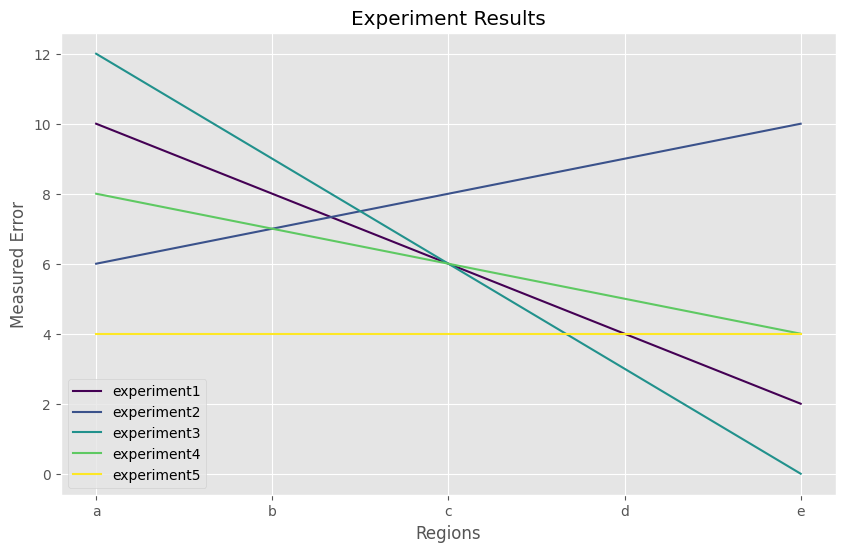

In [413]:
# create a list of the regions
regions = ['a', 'b', 'c', 'd', 'e']

# create a dictionary with the experiment results
experiments = {
    'experiment1': [10, 8, 6, 4, 2],
    'experiment2': [6, 7, 8, 9, 10],
    'experiment3': [12, 9, 6, 3, 0],
    'experiment4': [8, 7, 6, 5, 4],
    'experiment5': [4, 4, 4, 4, 4]
}

# create a figure and axis object
fig, ax = plt.subplots(figsize=(10, 6))

# loop through the experiments and plot each line
for experiment, values in experiments.items():
    ax.plot(regions, values, label=experiment)

# set the axis labels and legend
ax.set_xlabel('Regions')
ax.set_ylabel('Measured Error')
ax.set_title('Experiment Results')
ax.legend()

# show the plot
plt.show()

In [257]:
df[(df['region'] == 'A')&(df['multiplier'] == 0.25)&(df['train_size'] == 10)].mean()

C:\Users\troosma\AppData\Local\Temp\ipykernel_29144\3649948254.py:1: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  df[(df['region'] == 'A')&(df['multiplier'] == 0.25)&(df['train_size'] == 10)].mean()


train_size                 10.000000
random_seed                 2.000000
multiplier                  0.250000
bpoints_in_a                7.000000
bpoints_in_b                4.600000
bpoints_in_c                2.400000
bpoints_in_d                0.400000
bpoints_in_e                0.000000
ext_bpoints_in_a           13.600000
ext_bpoints_in_b            8.600000
ext_bpoints_in_c            3.600000
ext_bpoints_in_d            1.200000
ext_bpoints_in_e            0.800000
abs_diff_in_a              -0.348758
abs_diff_in_b              -0.741961
abs_diff_in_c              -0.550995
abs_diff_in_d              -1.424963
abs_diff_in_e              -2.297287
rel_diff_in_a              -1.683384
rel_diff_in_b              -1.660356
rel_diff_in_c              -1.290814
rel_diff_in_d              -1.590685
rel_diff_in_e              -1.804457
raw_mean2_in_a              0.318286
raw_mean2_in_b              0.447277
raw_mean2_in_c              1.290214
raw_mean2_in_d              0.975585
r

In [258]:
df_2 = df.groupby(['region', 'multiplier', 'train_size']).mean().reset_index()
df_2
# df_2.reset_index(inplace=True)
# sns.barplot(x='A', y='B', data=df_2);



,region,multiplier,train_size,random_seed,bpoints_in_a,bpoints_in_b,bpoints_in_c,bpoints_in_d,bpoints_in_e,ext_bpoints_in_a,...,raw_mean2_in_d,raw_mean2_in_e,raw_mean3_in_a,raw_mean3_in_b,raw_mean3_in_c,raw_mean3_in_d,raw_mean3_in_e,points_in_equal_regions,points_in_diff_region,total_points
0,A,0.25,10,2.0,7.0,4.6,2.4,0.4,0.0,13.6,...,0.975585,0.557305,0.667044,1.189238,1.841209,2.400548,2.854592,2.0,0.0,8.0
1,A,0.25,20,2.0,5.6,2.4,0.6,0.2,0.0,11.2,...,2.254769,2.780720,0.596274,1.006193,1.544099,2.174497,2.775782,4.0,1.0,17.0
2,A,0.25,30,2.0,3.4,6.6,1.8,0.0,0.0,11.6,...,2.252303,2.615842,0.489134,1.159714,1.536453,2.235472,3.084342,6.0,1.0,25.0
3,A,0.25,40,2.0,6.6,4.8,1.6,0.2,0.2,13.2,...,1.369364,1.822075,0.549896,1.091912,1.580449,2.259144,3.000289,8.0,2.0,34.0
4,A,0.25,50,2.0,6.6,2.6,1.4,0.6,0.0,13.4,...,1.715328,2.391290,0.632477,1.036879,1.562713,2.156092,2.772477,10.0,2.0,42.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
468,E,4.00,200,2.0,7.4,3.0,3.2,0.2,0.0,12.8,...,2.171438,2.767723,0.466392,1.002370,1.516076,2.107233,2.708951,40.0,160.0,320.0
469,E,4.00,250,2.0,7.4,5.6,0.8,0.2,0.0,15.2,...,1.989307,2.553435,0.456908,1.003442,1.527225,2.112613,2.697559,50.0,200.0,400.0
470,E,4.00,500,2.0,8.0,3.6,1.8,0.2,0.0,15.6,...,1.992869,2.694847,0.450068,1.002667,1.517737,2.105580,2.669842,100.0,400.0,800.0
471,E,4.00,750,2.0,8.6,2.8,0.8,0.8,0.0,14.8,...,2.116842,2.674646,0.449841,0.990946,1.511899,2.101476,2.671087,150.0,600.0,1200.0


<AxesSubplot: xlabel='abs_diff_in_b', ylabel='raw_mean2_in_b'>

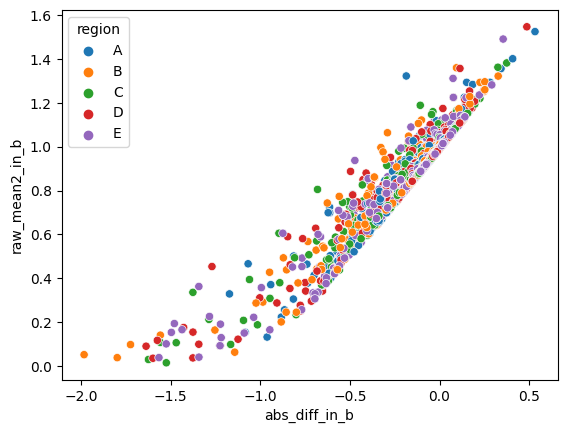

In [234]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
sns.scatterplot(ax=ax[0], data=df, x="abs_diff_in_a",y="raw_mean2_in_a", hue="region",)
sns.scatterplot(ax=ax[1], data=df, x="abs_diff_in_a",y="raw_mean3_in_a", hue="region",)

In [76]:
len([10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 125, 150, 175, 200, 250, 500, 750, 1000, 2000])

19